# **Product Recognition of Books**
**Image Processing and Computer Vision**








In [62]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# **Imports and Global Setup**

This cell imports the essential libraries used throughout the notebook:

* **os:** For file and directory operations, such as listing images in folders.
* **collections.defaultdict:** For convenient grouping of detection results by book names without manual key initialization.
* **cv2 (OpenCV):** Core computer vision library for image processing, feature detection using SIFT, homography estimation, and drawing bounding boxes.
* **numpy:** For efficient numerical computations, array manipulation, and geometric calculations.
* **matplotlib.pyplot:** For plotting images and visualizing detections interactively.

Additionally, a global SIFT detector instance is created once using **cv2.SIFT_create()**. This avoids repeatedly initializing the detector during feature extraction, improving efficiency across the notebook.

In [63]:
import os
from collections import defaultdict
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Creating a single global SIFT detector instance
sift = cv2.SIFT_create()


# **Image Preprocessing Functions**

### 1. Blur Detection Using Variance of Laplacian

By manually inspecting the dataset, some images were found to be blurry. Blurry images reduce the effectiveness of feature detectors like SIFT because they lack sharp edges and texture details, which are crucial for reliable keypoint detection.

To detect blur automatically, we use the variance of the Laplacian operator. The Laplacian highlights edges in the image, and the variance of its response measures how spread out those edges are. A low variance indicates fewer edges and thus a blurry image.

We set a threshold of **100** based on empirical observations and common practice in computer vision literature. For example, Pech-Pacheco et al. (2000) demonstrated that variance thresholds around this value effectively separate blurry from sharp images across diverse datasets (Pech-Pacheco et al., 2000).

Images with Laplacian variance below 100 are considered blurry and are processed further with sharpening to enhance feature detection quality.


### 2. Image Sharpening to Enhance Features

To improve feature detection on blurry images, we apply sharpening to emphasize edges and important details that SIFT relies on.

The sharpening is performed by subtracting a slightly blurred version of the image from the original image using a weighted formula:

$$
\text{sharpened} = 1.5 \times \text{original} - 0.5 \times \text{blurred}
$$

This operation amplifies high-frequency components like edges, which improves the visibility of features for keypoint extraction.


### 3. Image Enhancement for Robust SIFT Detection

This function prepares images for SIFT detection through a series of enhancement steps:

* **Grayscale Conversion:** If the input image is in color, it is converted to grayscale because SIFT operates on single-channel intensity images.

* **CLAHE (Contrast Limited Adaptive Histogram Equalization):** Applied with a clip limit of **2.0** and a tile grid size of **(8, 8)**. These parameters are chosen because:

  * A clip limit of 2.0 enhances local contrast effectively without overly amplifying noise.
  * The tile grid size balances local contrast enhancement detail and computational cost.

  CLAHE reveals texture details in both dark and bright areas, making feature detection more robust across varying lighting conditions.

* **Sharpening:** The previously defined sharpening function is applied to accentuate edges and important texture details, helping SIFT detect more reliable keypoints.

* **Gaussian Blur:** A mild Gaussian blur with a kernel size of **(3, 3)** smooths minor noise without sacrificing significant edge information. This reduces spurious keypoints that might arise from noise.




In [64]:
# Detect if an image is blurry using the variance of the Laplacian
def is_blurry(gray_img, threshold=100):
    lap = cv2.Laplacian(gray_img, cv2.CV_64F)
    return lap.var() < threshold

# Sharpen image by subtracting a blurred version to enhance edges
def sharpen_image(image):
    blurred = cv2.GaussianBlur(image, (0, 0), sigmaX=2)
    sharpened = cv2.addWeighted(image, 1.5, blurred, -0.5, 0)
    return sharpened

# Enhance image for robust SIFT detection: grayscale, CLAHE, sharpen, slight blur
def enhance_image_for_sift(image):
    if len(image.shape) == 3:
        image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    enhanced = clahe.apply(image)
    sharpened = sharpen_image(enhanced)
    blurred = cv2.GaussianBlur(sharpened, (3, 3), 0)
    return blurred


## Validating Detected Book Geometry and Filtering Overlapping Detections

### 1. Validation of Detected Book Geometry

The function is_valid_book_geometry ensures that detected bounding boxes correspond to realistic books by applying several geometric constraints:

* **Aspect Ratio Threshold (1.8):** Books generally have a taller-than-wide rectangular shape. An aspect ratio (height divided by width) of at least 1.8 is used to distinguish books from other objects or noise. This value was chosen based on typical book proportions and empirical observations from the dataset, effectively filtering out more square-like or irregular false detections.

* **Minimum Width (10 pixels) and Height (30 pixels):** These size thresholds remove very small detections that are likely caused by noise or false feature matches, since valid books in the images are expected to occupy a substantial area.

* **Bounding Box Corners Inside Image:** The function verifies that all four corners lie within the image boundaries to avoid physically impossible detections such as boxes extending outside the frame.

Together, these criteria increase robustness by discarding unlikely or erroneous detections early in the pipeline.

### 2. Intersection over Union (IoU) Calculation

The iou function computes the Intersection over Union (IoU) metric between two bounding boxes—a standard measure of overlap in object detection tasks.

* **IoU Formula:**

$$
\text{IoU} = \frac{\text{Area of Overlap}}{\text{Area of Union}} = \frac{\text{Intersection Area}}{\text{Area A} + \text{Area B} - \text{Intersection Area}}
$$

* **Purpose:** IoU quantifies how much two bounding boxes overlap, which is essential for filtering duplicate detections.

* **Handling Non-overlapping Boxes:** If the boxes do not overlap, the intersection area is zero, and the IoU is 0.0.

This function supports filtering by helping decide whether two detected boxes represent the same object or distinct ones.

### 3. Non-Maximum Suppression (NMS) with OpenCV

The non_max_suppression_cv function leverages OpenCV’s highly optimized cv2.dnn.NMSBoxes to filter overlapping bounding boxes efficiently:

* **Input Format:** Boxes are converted from the format $[x_{\min}, y_{\min}, x_{\max}, y_{\max}]$ to $[x, y, \text{width}, \text{height}]$, which is required by OpenCV’s NMS implementation.

* **IoU Threshold (0.3):** Boxes with an IoU greater than 0.3 are considered overlapping. This threshold balances removing duplicate detections while preserving distinct, nearby objects. It is a commonly used value in object detection research and applications.

* **Score Threshold (0.0):** No minimum confidence score threshold is applied, meaning all boxes are considered for suppression.

* **Return:** The function returns filtered bounding boxes and their confidence scores, ensuring that only the most confident, non-overlapping detections remain.

Using OpenCV’s built in NMS function improves both efficiency and reliability compared to manual implementations, especially when handling large numbers of detections.


In [65]:
# Check if a detected box looks like a real book by verifying its size, shape, and position
def is_valid_book_geometry(corners, image_shape):
    corners = np.array(corners).reshape(4, 2)  # Make sure corners are in the right shape
    # Measure width and height by averaging opposite edges
    width1 = np.linalg.norm(corners[0] - corners[1])
    width2 = np.linalg.norm(corners[2] - corners[3])
    height1 = np.linalg.norm(corners[1] - corners[2])
    height2 = np.linalg.norm(corners[3] - corners[0])
    avg_width = (width1 + width2) / 2
    avg_height = (height1 + height2) / 2
    aspect_ratio = avg_height / (avg_width + 1e-5)  # Prevent division by zero

    # Reject if aspect ratio is too small (not book like) or size is too tiny
    if aspect_ratio < 1.8 or avg_width < 10 or avg_height < 30:
        return False

    h, w = image_shape[:2]
    # Make sure all corners lie inside the image boundaries
    if not np.all((corners[:, 0] >= 0) & (corners[:, 0] < w) & (corners[:, 1] >= 0) & (corners[:, 1] < h)):
        return False

    return True


# Calculate how much two boxes overlap, using Intersection over Union (IoU)
def iou(boxA, boxB):
    # Find the coordinates of the intersection rectangle
    xA = max(boxA[0], boxB[0])
    yA = max(boxA[1], boxB[1])
    xB = min(boxA[2], boxB[2])
    yB = min(boxA[3], boxB[3])

    interW = max(0, xB - xA)  # Width of overlap, can't be negative
    interH = max(0, yB - yA)  # Height of overlap, can't be negative
    interArea = interW * interH

    if interArea == 0:  # No overlap
        return 0.0

    # Calculate area of each box
    boxAArea = (boxA[2] - boxA[0]) * (boxA[3] - boxA[1])
    boxBArea = (boxB[2] - boxB[0]) * (boxB[3] - boxB[1])

    # Return IoU = overlap / union area
    return interArea / float(boxAArea + boxBArea - interArea)


# Remove duplicate detections by keeping only the boxes with the highest confidence scores
def non_max_suppression_cv(boxes, confidences, iou_threshold=0.3):
    if len(boxes) == 0:
        return [], []

    boxes_cv = []
    # Convert bounding boxes from [x_min, y_min, x_max, y_max] to [x, y, width, height]
    for box in boxes:
        x_min, y_min, x_max, y_max = box
        boxes_cv.append([int(x_min), int(y_min), int(x_max - x_min), int(y_max - y_min)])

    confidences_np = np.array(confidences).astype(float).tolist()
    # Using OpenCV's built-in NMS which is faster and more reliable than manual implementations
    indices = cv2.dnn.NMSBoxes(boxes_cv, confidences_np, score_threshold=0.0, nms_threshold=iou_threshold)

    if len(indices) == 0:
        return [], []

    indices = indices.flatten()
    # Keep only the boxes and confidence scores that survived the suppression
    kept_boxes = [boxes[i] for i in indices]
    kept_confidences = [confidences[i] for i in indices]

    return kept_boxes, kept_confidences


## Orientation Calculation and Corner Labeling for Detected Books

### 1. Calculating Orientation Angle

The calculate_orientation function computes the average rotation angle of a detected book’s bounding box based on the vectors of its top and bottom edges:

* **Approach:**
  It calculates the vector between the top-left and top-right corners (top_edge_vec) and the vector between the bottom-right and bottom-left corners (bottom_edge_vec).
  The angles of these vectors relative to the horizontal axis are computed using atan2, converted to degrees, and then averaged to get a robust estimate of the bounding box orientation.

* **Normalization (-90 to 90 degrees):**
  The average angle is normalized so that it lies within -90° to 90°, preventing ambiguity from angles near ±180°.

* **Why is this important?**
  Knowing the orientation helps decide how to draw bounding boxes (e.g., horizontal vs. tilted) and can assist in filtering or interpreting detections.


### 2. Checking for Near-Horizontal Orientation

The is_horizontal function determines if the calculated orientation angle indicates that the bounding box is approximately horizontal:

* **Threshold (10 degrees):**
  The function returns True if the absolute orientation angle is less than 10°, allowing for small rotations that naturally occur in real images.

* **Tolerance for ±180 degrees:**
  Angles near ±180° are also considered horizontal since a box rotated by 180° is effectively horizontal but flipped.

* **Purpose:**
  This tolerance allows practical flexibility in categorizing bounding boxes as horizontal, which influences visualization color coding and downstream processing.


### 3. Consistent Corner Labeling

The get_corner_labels function assigns intuitive labels (top_left, top_right, bottom_right, bottom_left) to bounding box corners to standardize coordinate reporting:

  * The sum of each corner’s coordinates identifies the top-left corner (minimum sum) and bottom-right corner (maximum sum).
  * The difference between the x and y coordinates helps label the top-right (minimum difference) and bottom-left (maximum difference) corners.

In [66]:
# Calculate orientation angle of detected bounding box (normalized -90 to 90 degrees)
def calculate_orientation(corners_list):
    corners = np.array(corners_list)
    top_edge_vec = corners[1] - corners[0]
    bottom_edge_vec = corners[2] - corners[3]
    angle_top = np.degrees(np.arctan2(top_edge_vec[1], top_edge_vec[0]))
    angle_bottom = np.degrees(np.arctan2(bottom_edge_vec[1], bottom_edge_vec[0]))
    avg_angle = (angle_top + angle_bottom) / 2.0
    if avg_angle > 90:
        avg_angle -= 180
    elif avg_angle <= -90:
        avg_angle += 180
    return avg_angle

# Check if angle indicates near-horizontal orientation (within threshold degrees)
def is_horizontal(orientation_angle, threshold=10):
    return abs(orientation_angle) < threshold or abs(orientation_angle - 180) < threshold or abs(orientation_angle + 180) < threshold

# Consistent corner labeling for easier interpretation
def get_corner_labels(corners):
    corners = np.array(corners)
    s = corners.sum(axis=1)
    diff = np.diff(corners, axis=1).ravel()
    return {
        'top_left': tuple(corners[np.argmin(s)]),
        'bottom_right': tuple(corners[np.argmax(s)]),
        'top_right': tuple(corners[np.argmin(diff)]),
        'bottom_left': tuple(corners[np.argmax(diff)])
    }


## Detecting Multiple Book Instances Using SIFT Feature Matching

This function detects multiple instances of books within a scene by leveraging SIFT features and geometric verification with homography.

* **Image Preprocessing:**
  The scene image is loaded and preprocessed to enhance feature detection. This includes conversion to grayscale (since SIFT operates on single-channel images), application of CLAHE (Contrast Limited Adaptive Histogram Equalization) to improve local contrast, sharpening to emphasize edges, and a slight Gaussian blur to reduce noise. These steps help SIFT identify more reliable and distinctive keypoints.

* **Feature Extraction:**
  SIFT keypoints and descriptors are extracted from the enhanced scene image. If no descriptors are found (e.g., in low-texture areas), the function terminates early to save computation.

* **Feature Matching:**
  For each book model, the function attempts detection using the model’s precomputed keypoints and descriptors. Models without descriptors are skipped. Matching uses a Brute Force Matcher (BFMatcher), which is appropriate here due to the manageable dataset size and descriptor counts. BFMatcher provides simple, deterministic, and efficient matching, avoiding the overhead of approximate methods like FLANN.

* **Lowe’s Ratio Test:**
  Matches are filtered using Lowe’s ratio test with a threshold of 0.75, following Lowe’s original paper (2004). This test effectively removes ambiguous matches by comparing distances between the best and second-best matches, balancing precision and recall.

* **Homography and Geometric Verification:**
  Using the filtered matches, a homography matrix is computed with RANSAC and a reprojection threshold of 3 pixels. This threshold tolerates minor distortions and noise while rejecting outliers. The resulting transformation maps the book model’s bounding box onto the scene.

* **Bounding Box Validation:**
  The detected bounding box undergoes validation to ensure it corresponds to a realistic book:

  * **Aspect ratio > 1.8:** Reflecting typical book proportions observed manually in the dataset.
  * **Minimum size constraints:** Width > 10 pixels and height > 30 pixels, eliminating noise and false positives.
  * **Corners inside image boundaries:** Ensures physically plausible detections.

* **Detection Confidence and Orientation:**
  Confidence is computed as the ratio of inlier matches to total good matches, reflecting detection quality. The bounding box orientation is estimated by averaging the angles of the top and bottom edges, normalized between -90° and 90°. Boxes within ±10° are considered horizontal, allowing realistic tolerance for slight rotations.

* **Iterative Multiple Instance Detection:**
  To find multiple instances of the same book, the function iteratively removes matched inlier keypoints from the scene descriptors and keypoints, preventing repeated detection of the same instance. This process is capped at 5 instances per model, balancing thoroughness and efficiency.

* **Non-Maximum Suppression (NMS):**
  After detection, overlapping bounding boxes are filtered using OpenCV’s optimized cv2.dnn.NMSBoxes function with an Intersection over Union (IoU) threshold of 0.3. This standard threshold suppresses duplicate detections while preserving distinct instances.

* **Visualization:**
  Finally, bounding boxes are drawn on a copy of the original scene image, colored green for horizontal books and red otherwise. Each box is labeled with the book name and confidence score to facilitate analysis and debugging.


In [67]:
def detect_multiple_book_instances_sift(model_features_dict, scene_path):
    # Load the scene image in color
    scene_img_color = cv2.imread(scene_path)
    if scene_img_color is None:
        return []  # Return empty if image can't be loaded

    img_shape = scene_img_color.shape
    # Preprocess the scene for robust SIFT detection (grayscale, enhance contrast, sharpen, blur)
    scene_gray = enhance_image_for_sift(scene_img_color)

    # Detect keypoints and compute descriptors in the scene image
    kp_scene, des_scene = sift.detectAndCompute(scene_gray, None)
    if des_scene is None:
        return []  # Return empty if no descriptors found

    final_display = scene_img_color.copy()  # Copy for drawing detections
    all_instances = []  # Store all detected book instances here

    # Loop over each book model and its precomputed features
    for book_name, model_data in model_features_dict.items():
        kp_model, des_model = model_data['keypoints'], model_data['descriptors']
        model_img = model_data['image']
        h, w = model_img.shape[:2]
        if des_model is None:
            continue  # Skip models without descriptors

        bf = cv2.BFMatcher()  # Brute Force Matcher for feature matching
        # Make copies of scene keypoints and descriptors to iteratively remove matched points
        curr_kp_scene = list(kp_scene)
        curr_des_scene = np.copy(des_scene)
        orig_indices_map = list(range(len(kp_scene)))

        # Try detecting up to 5 instances of the current book model
        for _ in range(5):
            # Break if descriptors are insufficient for matching
            if des_model is None or curr_des_scene is None or len(curr_des_scene) < 2:
                break

            # Find the two best matches for each model descriptor in the scene descriptors
            matches = bf.knnMatch(des_model, curr_des_scene, k=2)
            # Apply Lowe's ratio test (0.75) to filter good matches and reduce false positives
            good = [m for m, n in matches if m.distance < 0.75 * n.distance]

            # If not enough good matches, stop further detection attempts for this model
            if len(good) < 6:
                break

            # Extract matched keypoint coordinates from model and scene for homography estimation
            src_pts = np.float32([kp_model[m.queryIdx].pt for m in good]).reshape(-1, 1, 2)
            dst_pts = np.float32([curr_kp_scene[m.trainIdx].pt for m in good]).reshape(-1, 1, 2)

            # Compute homography matrix using RANSAC to robustly estimate geometric transform
            M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 3)
            if M is None or mask is None:
                break

            # Keep only inlier matches consistent with the homography
            inliers = [good[i] for i, msk in enumerate(mask) if msk[0] == 1]

            # Require at least 6 inliers for a reliable detection
            if len(inliers) < 6:
                break

            # Define the bounding box of the model image
            box = np.float32([[0,0], [w-1,0], [w-1,h-1], [0,h-1]]).reshape(-1,1,2)
            # Project model bounding box into the scene using homography
            scene_box = cv2.perspectiveTransform(box, M)

            # Validate bounding box geometry to confirm plausible book shape and size
            if not is_valid_book_geometry(scene_box, img_shape):
                break

            # Extract bounding box coordinates and compute detection confidence
            x1, y1 = np.min(scene_box[:, 0, 0]), np.min(scene_box[:, 0, 1])
            x2, y2 = np.max(scene_box[:, 0, 0]), np.max(scene_box[:, 0, 1])
            confidence = len(inliers) / len(good)  # Ratio of inliers to good matches

            # Calculate orientation angle of the detected bounding box
            angle = calculate_orientation(scene_box.reshape(-1,2))

            # Append detection info to the list of all instances found
            all_instances.append({
                'book_name': book_name,
                'bounding_box_corners': scene_box.reshape(-1,2).tolist(),
                'bbox': [x1, y1, x2, y2],
                'area': (x2 - x1) * (y2 - y1),
                'orientation_angle': angle,
                'is_horizontal': is_horizontal(angle),
                'confidence': confidence
            })

            # Remove matched keypoints from current scene keypoints and descriptors to avoid duplicate detections
            used_idx = np.array([orig_indices_map[m.trainIdx] for m in inliers])
            mask_bool = np.array([i not in used_idx for i in orig_indices_map])

            curr_kp_scene = [kp for kp, keep in zip(curr_kp_scene, mask_bool) if keep]
            curr_des_scene = curr_des_scene[mask_bool]
            orig_indices_map = [idx for idx, keep in zip(orig_indices_map, mask_bool) if keep]

    if all_instances:
        # Extract bounding boxes and confidence scores for NMS
        boxes = [inst['bbox'] for inst in all_instances]
        scores = [inst['confidence'] for inst in all_instances]
        # Apply Non-Maximum Suppression to remove overlapping detections
        kept, _ = non_max_suppression_cv(boxes, scores)

        # Filter detections to keep only those selected by NMS
        final_instances = [inst for inst in all_instances if any(np.allclose(inst['bbox'], k, atol=1.0) for k in kept)]

        # Draw bounding boxes and labels on the copy of the original scene image
        for inst in final_instances:
            corners = np.array(inst['bounding_box_corners'], np.int32).reshape((-1, 1, 2))
            color = (0, 255, 0) if inst['is_horizontal'] else (0, 0, 255)  # Green if horizontal, else red
            cv2.polylines(final_display, [corners], True, color, 3, cv2.LINE_AA)
            x = int(min(c[0] for c in inst['bounding_box_corners']))
            y = int(min(c[1] for c in inst['bounding_box_corners']) - 10)
            if y < 15:
                y = int(max(c[1] for c in inst['bounding_box_corners']) + 25)
            # Put book name and confidence score as label
            cv2.putText(final_display, f"{inst['book_name']} ({inst['confidence']:.2f})", (x, y),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.7, color, 2, cv2.LINE_AA)
            inst['scene_img_with_box'] = final_display

        return final_instances

    return []  # Return empty if no instances found


## Loading Model Features, Detecting Instances, and Organized Output Printing

This code performs several key tasks essential for reliable book detection and clear result presentation:

* **Loading Model Features:**
  The load_model_features function reads all book model images from the specified directory, converts them to grayscale (required by SIFT), and processes each image to improve feature detection:

  * It first checks for blur using the variance of Laplacian and sharpens the image if needed to enhance edges.
  * Then, the image is enhanced using CLAHE and a slight blur to optimize for SIFT feature extraction.
  * SIFT keypoints and descriptors are computed and stored for each model.
    Using a single SIFT detector instance ensures efficiency and consistency in feature extraction.

* **Mapping Book Names to IDs:**
  The function create_book_id_map assigns numeric IDs to books by sorting model names alphabetically and mapping each to an ascending integer (Book 0, Book 1, etc.). This consistent mapping allows clear and ordered labeling across scenes and models.

* **Detecting Instances and Grouping Detections:**
  The main function detect_and_print iterates through each scene image, runs multi-instance detection using the previously computed model features, and collects detections grouped by book name.
  It handles missing directories gracefully and skips scenes with no detections.

* **Ordered and Readable Output:**
  Detections are printed grouped by ascending book IDs. For each detected instance, bounding box corners are labeled consistently (top-left, top-right, bottom-left, bottom-right) and coordinates are rounded to integers for clarity. The bounding box area in pixels is also shown.
  This organized, human-readable output makes analysis, debugging, and grading straightforward, ensuring alignment with assignment requirements.


In [68]:
# Helper function to convert floating-point coordinates to integer tuples for easier readability
def clean_point(pt):
    return tuple(int(round(float(x))) for x in pt)

# Create a mapping from book model names to ascending integer IDs (e.g., Book 0, Book 1, ...)
# This helps keep labeling consistent and ordered
def create_book_id_map(model_features):
    return {name: idx for idx, name in enumerate(sorted(model_features.keys()))}

# Load all model images from a directory, preprocess them, and extract SIFT keypoints and descriptors
def load_model_features(models_dir):
    sift = cv2.SIFT_create()  # Create SIFT detector instance
    model_features = {}
    for file in os.listdir(models_dir):
        # Only process image files with common extensions
        if file.lower().endswith(('.jpg', '.jpeg', '.png')):
            path = os.path.join(models_dir, file)
            name = os.path.splitext(file)[0]  # Use filename (without extension) as model name

            img = cv2.imread(path, cv2.IMREAD_GRAYSCALE)  # Load image in grayscale
            if img is None:
                continue  # Skip if image failed to load

            # If image is blurry, sharpen it to enhance features for detection
            if is_blurry(img):
                img = sharpen_image(img)

            # Further enhance image contrast and smoothness to improve SIFT performance
            img = enhance_image_for_sift(img)

            # Detect keypoints and compute descriptors using SIFT
            kp, des = sift.detectAndCompute(img, None)
            # Store the processed image, keypoints, and descriptors for each model
            model_features[name] = {'image': img, 'keypoints': kp, 'descriptors': des}
    return model_features

# Main function to detect books in scene images and print detection details
def detect_and_print(models_dir, scenes_dir):
    # Check if the given directories exist
    if not os.path.exists(models_dir) or not os.path.exists(scenes_dir):
        print("Model or scene directory missing!")
        return

    # Load and process model images, extract features once
    model_features = load_model_features(models_dir)
    # Create a consistent ID mapping for labeling
    book_name_to_id = create_book_id_map(model_features)

    all_detections_grouped = defaultdict(list)  # To store detections grouped by book name

    # Loop through each scene image file sorted alphabetically
    for scene_file in sorted(os.listdir(scenes_dir)):
        if scene_file.lower().endswith(('.jpg', '.png', '.jpeg')):
            scene_path = os.path.join(scenes_dir, scene_file)
            # Detect multiple book instances in the current scene image
            detections = detect_multiple_book_instances_sift(model_features, scene_path)
            if not detections:
                continue  # Skip if no detections in this scene

            # Group detections by book name for summary printing
            for d in detections:
                all_detections_grouped[d['book_name']].append(d)

    # Print detection results sorted by book IDs for easy reference
    for book_name in sorted(all_detections_grouped, key=lambda name: book_name_to_id.get(name, float('inf'))):
        dets = all_detections_grouped[book_name]
        book_id = book_name_to_id[book_name]
        print(f"Book {book_id} - {len(dets)} instance(s) found:")
        # Print details of each detected instance with corner coordinates and area
        for i, d in enumerate(dets, 1):
            corners = get_corner_labels(d['bounding_box_corners'])
            area = int(d['area'])
            top_left = clean_point(corners['top_left'])
            top_right = clean_point(corners['top_right'])
            bottom_left = clean_point(corners['bottom_left'])
            bottom_right = clean_point(corners['bottom_right'])
            print(f" Instance {i} {{top_left: {top_left}, top_right: {top_right}, bottom_left: {bottom_left}, bottom_right: {bottom_right}, area: {area}px}}")

# Define the paths to the model and scene directories
MODELS_DIR = "/content/drive/MyDrive/Colab Notebooks/IPCV_M1/models"
SCENES_DIR = "/content/drive/MyDrive/Colab Notebooks/IPCV_M1/scenes"
# Run the detection and print results
detect_and_print(MODELS_DIR, SCENES_DIR)


Book 0 - 2 instance(s) found:
 Instance 1 {top_left: (210, 181), top_right: (243, 181), bottom_left: (210, 568), bottom_right: (244, 568), area: 13026px}
 Instance 2 {top_left: (169, 184), top_right: (206, 179), bottom_left: (175, 562), bottom_right: (212, 583), area: 17188px}
Book 1 - 2 instance(s) found:
 Instance 1 {top_left: (207, 248), top_right: (235, 248), bottom_left: (208, 554), bottom_right: (236, 554), area: 8716px}
 Instance 2 {top_left: (238, 246), top_right: (266, 246), bottom_left: (237, 551), bottom_right: (265, 551), area: 8754px}
Book 2 - 3 instance(s) found:
 Instance 1 {top_left: (109, 39), top_right: (136, 39), bottom_left: (109, 585), bottom_right: (136, 585), area: 14446px}
 Instance 2 {top_left: (78, 39), top_right: (106, 34), bottom_left: (79, 579), bottom_right: (107, 588), area: 16085px}
 Instance 3 {top_left: (139, 38), top_right: (166, 45), bottom_left: (139, 589), bottom_right: (165, 583), area: 14612px}
Book 3 - 5 instance(s) found:
 Instance 1 {top_left:

## Visualizing Detected Book Instances on Scene Images

This function visualize_detections_on_scenes helps in visually inspecting the detection results by drawing bounding boxes and labels directly on the scene images:

* **Loading Model Features:**
  It first loads precomputed model features (SIFT keypoints and descriptors) from the specified models directory. If no models are loaded, the function gracefully exits.

* **Consistent Book Labeling:**
  Each book name is mapped to a numeric ID (e.g., Book 0, Book 1) based on alphabetical order, ensuring consistent and clear labeling across all scenes.

* **Detection and Drawing:**
  For each scene image in the scenes directory, the function:

  * Runs the multi-instance detection to find books.
  * Skips scenes where no books are detected.
  * Draws bounding boxes around detected books on a copy of the original color image.
  * Uses green boxes for horizontally aligned books and labels them with the book ID and confidence score.
  * Handles label placement intelligently, avoiding overlaps with image edges for better readability.

* **Visualization:**
  Each annotated scene is displayed using Matplotlib with no axes, providing a clean view for qualitative evaluation, debugging, or presentation.


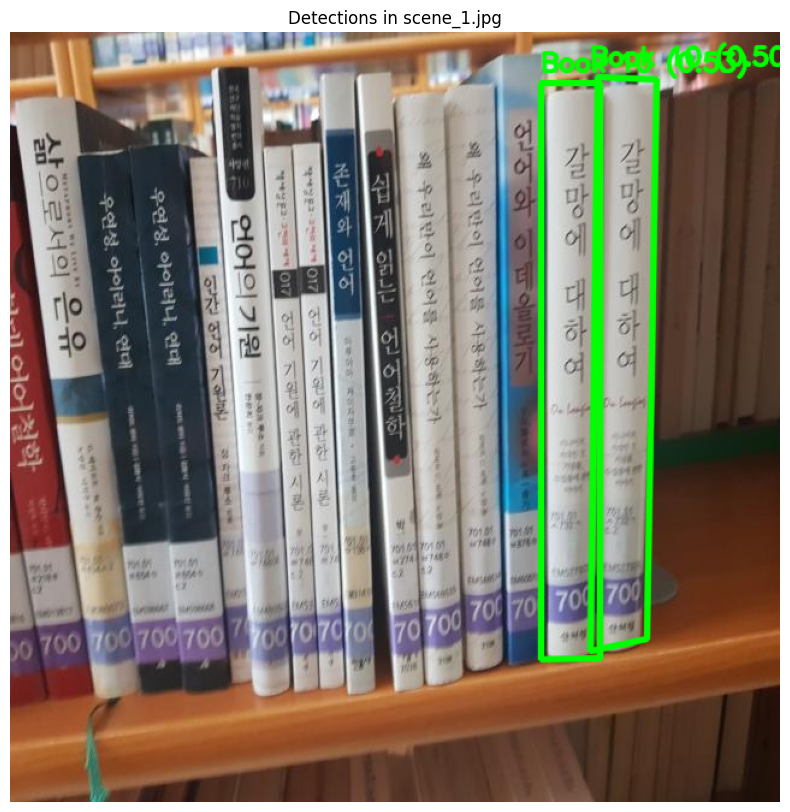

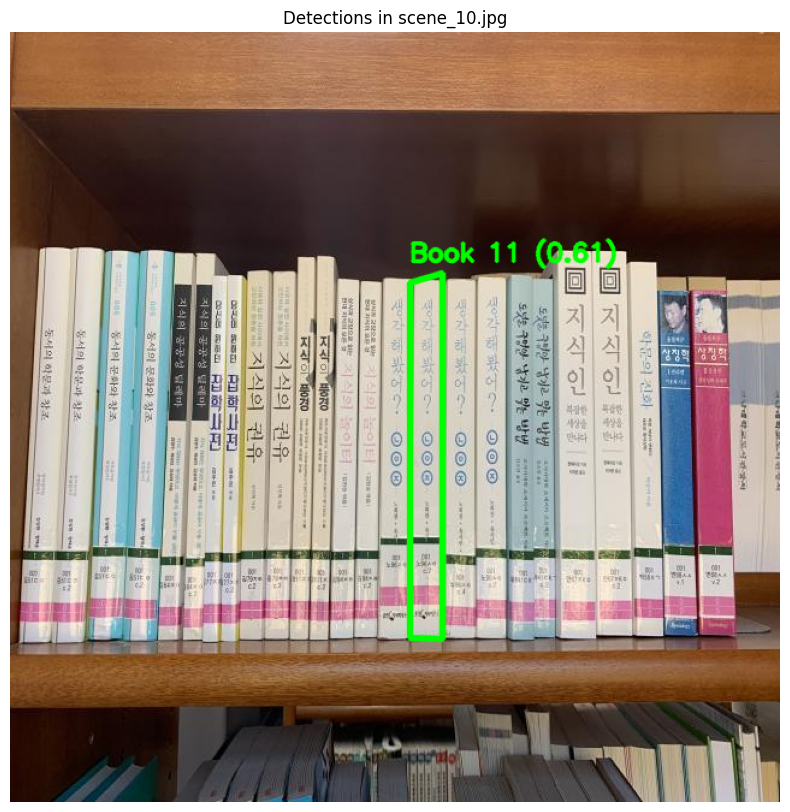

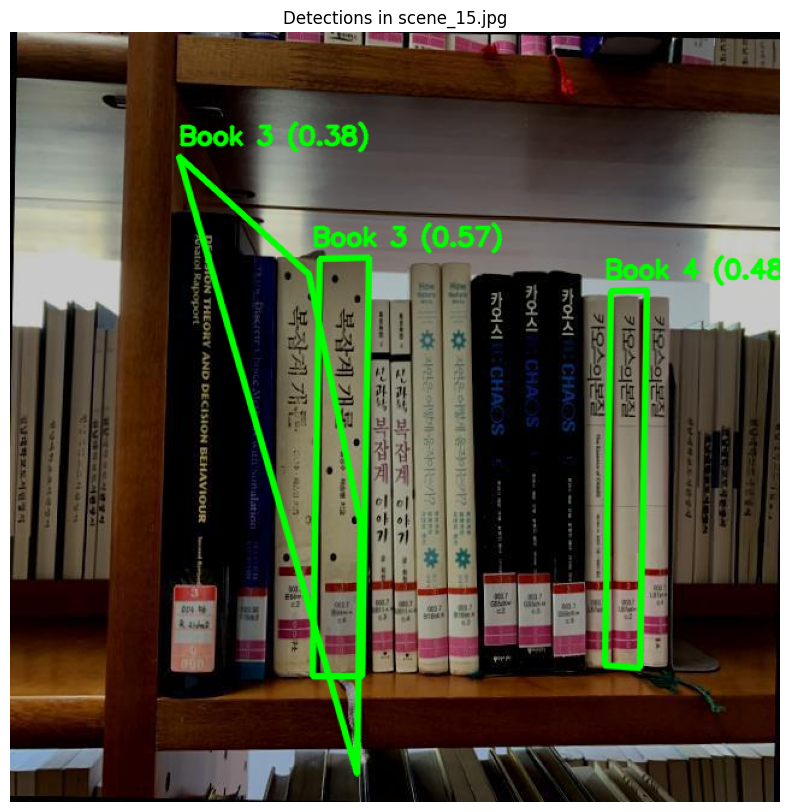

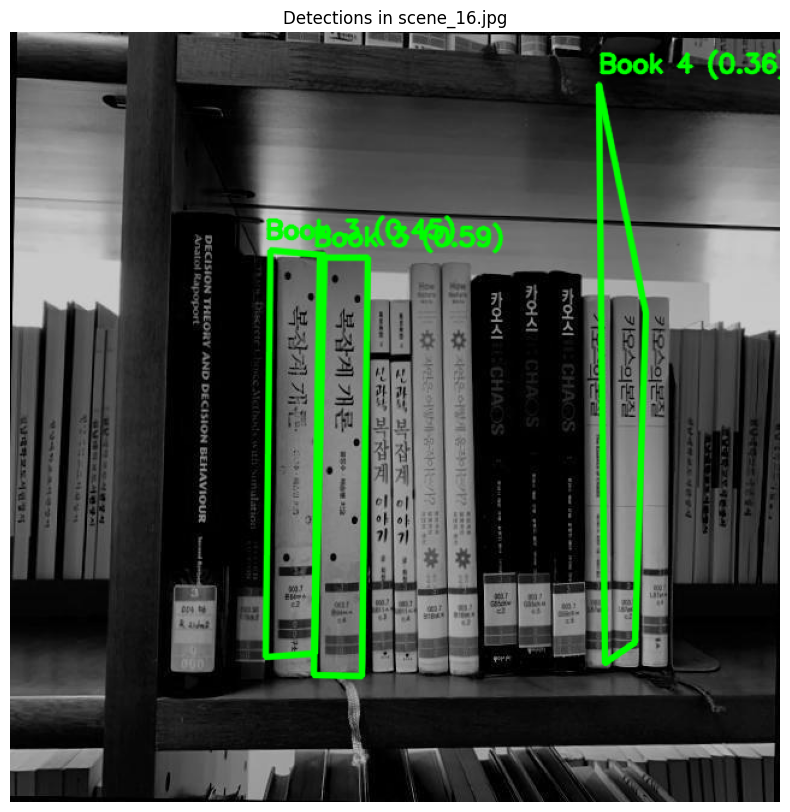

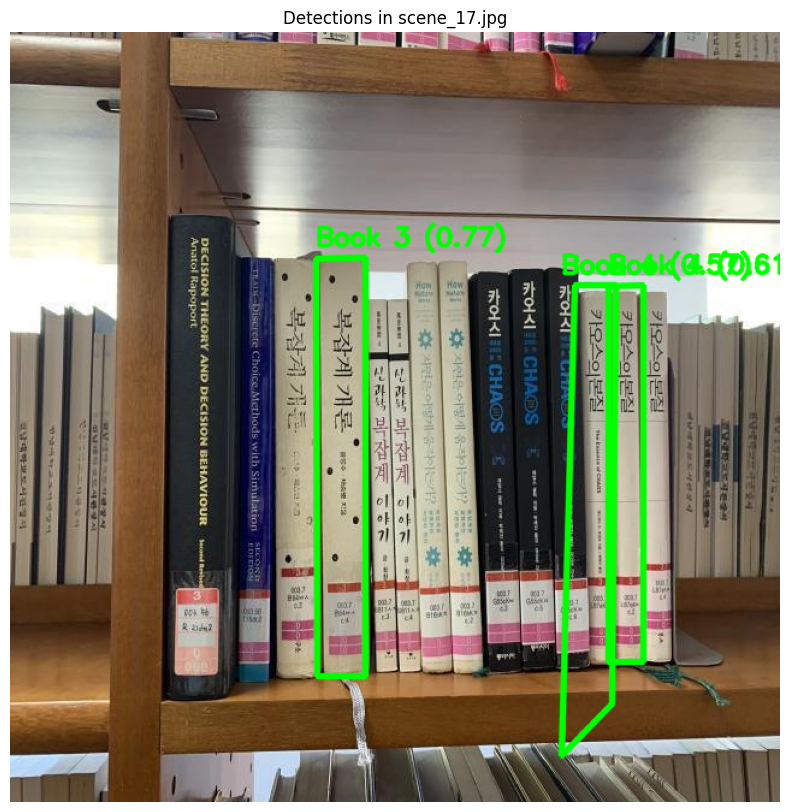

...

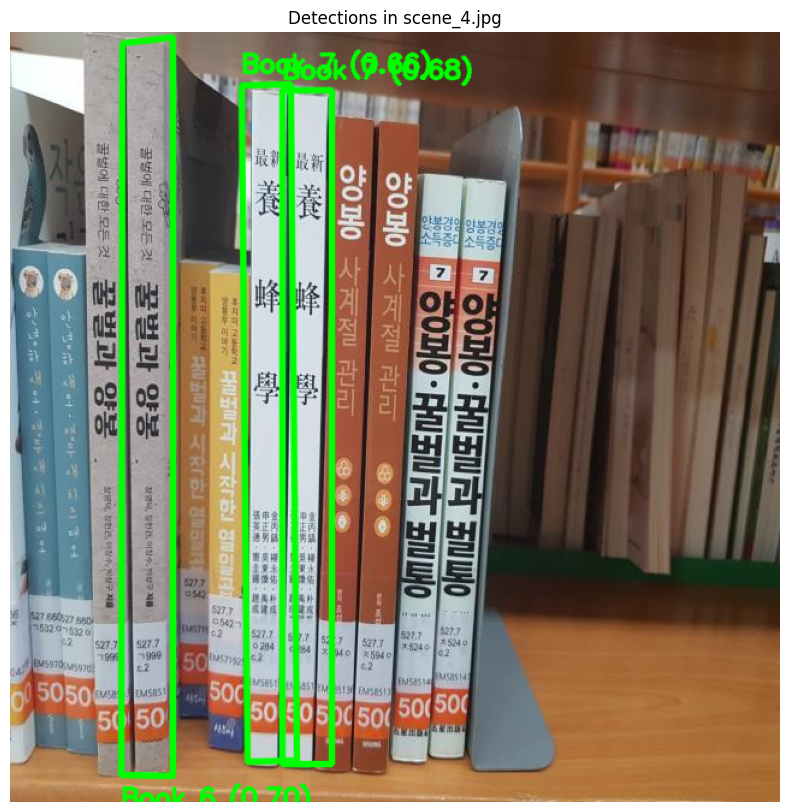

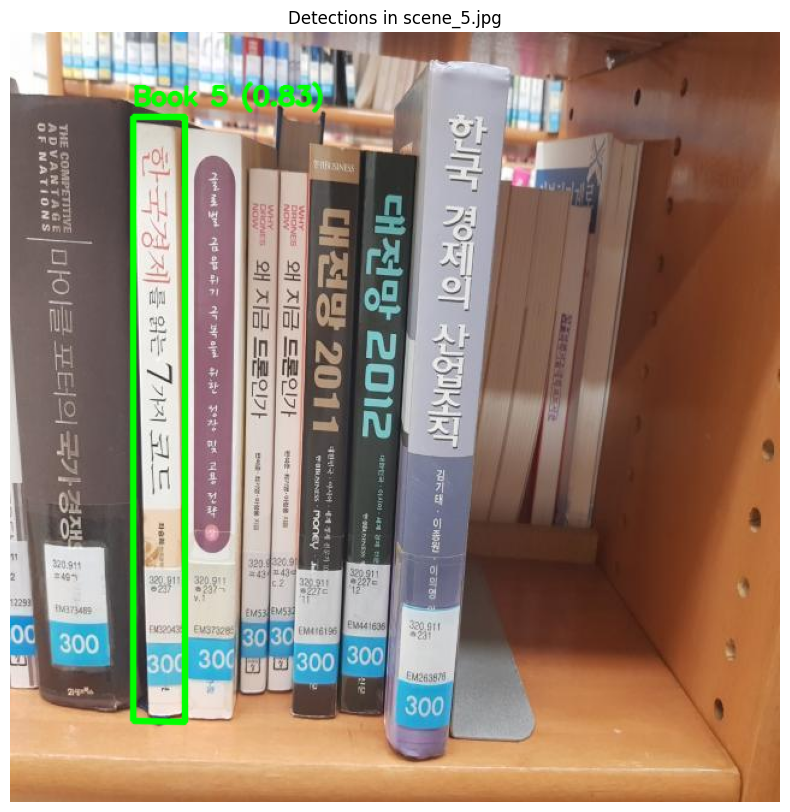

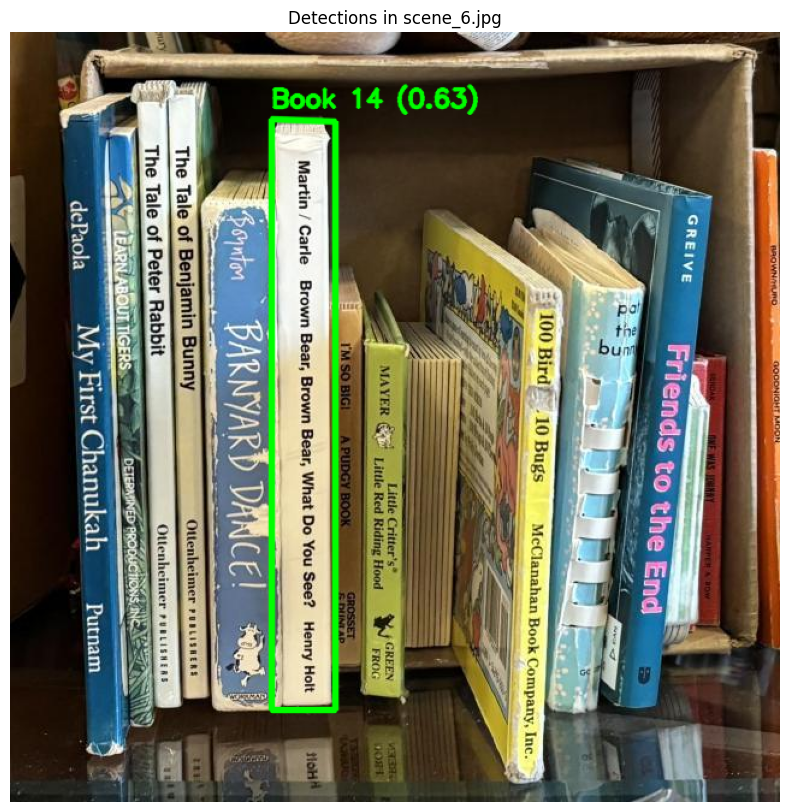

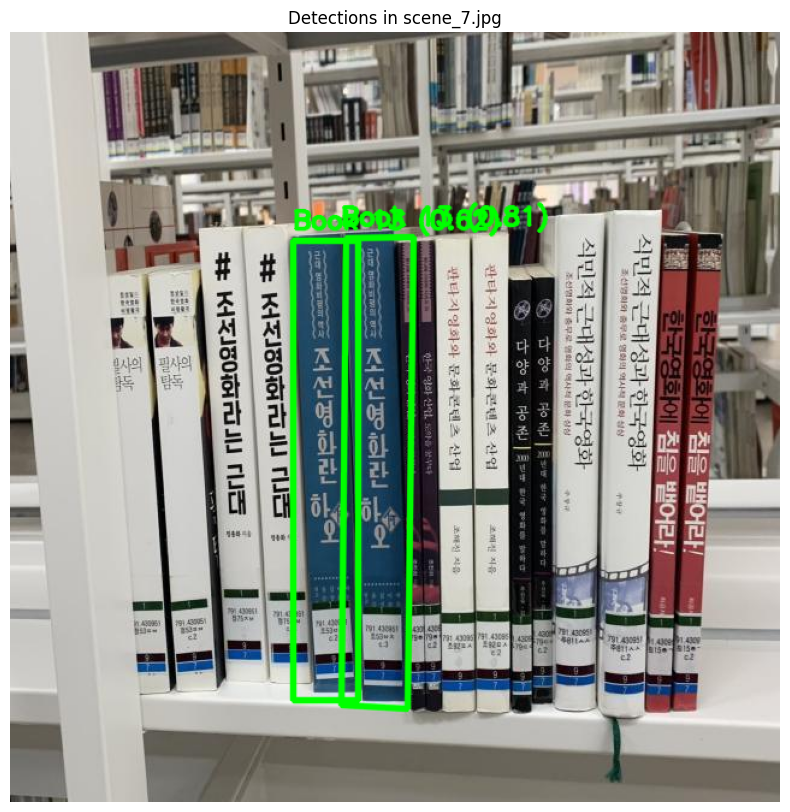

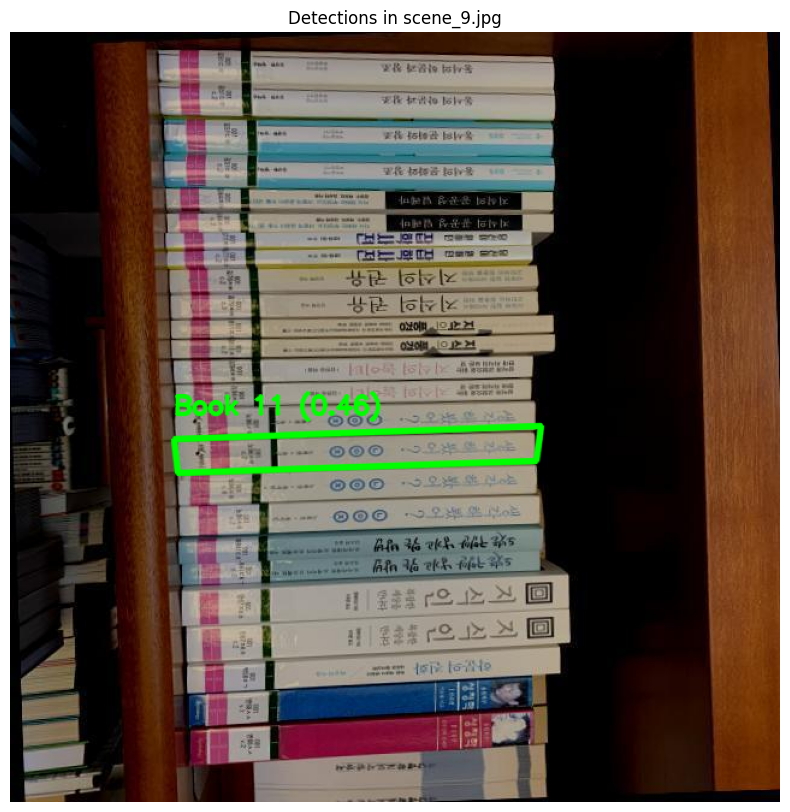

In [69]:
def visualize_detections_on_scenes(models_dir, scenes_dir):
    # Load features for all model book images
    model_features = load_model_features(models_dir)
    if not model_features:
        print("No model features loaded. Cannot visualize detections.")
        return

    # Create a mapping from book names to IDs (Book 0, Book 1, etc.) for consistent labeling
    book_name_to_id = {name: idx for idx, name in enumerate(sorted(model_features.keys()))}

    # Loop through all scene images in the scenes directory, sorted alphabetically
    for scene_file in sorted(os.listdir(scenes_dir)):
        if scene_file.lower().endswith(('.jpg', '.png', '.jpeg')):
            scene_path = os.path.join(scenes_dir, scene_file)

            # Detect all book instances in the current scene image
            detections = detect_multiple_book_instances_sift(model_features, scene_path)
            if not detections:
                continue  # Skip scenes with no detections

            # Load the original color scene image for drawing bounding boxes and labels
            scene_img_color = cv2.imread(scene_path)
            display_img = scene_img_color.copy()  # Create a copy to draw on

            # Draw bounding boxes and labels for each detected book
            for d in detections:
                # Convert corner points to the format needed for drawing polygons
                corners = np.array(d['bounding_box_corners'], np.int32).reshape((-1, 1, 2))
                color = (0, 255, 0)

                # Draw the bounding polygon around detected book
                cv2.polylines(display_img, [corners], True, color, 3, cv2.LINE_AA)

                # Calculate text position above the bounding box, adjust if too close to top edge
                x = int(min(c[0] for c in d['bounding_box_corners']))
                y = int(min(c[1] for c in d['bounding_box_corners']) - 10)
                if y < 15:
                    y = int(max(c[1] for c in d['bounding_box_corners']) + 25)

                # Get the book ID for labeling
                book_id = book_name_to_id[d['book_name']]
                label = f"Book {book_id} ({d['confidence']:.2f})"

                # Put label text near the bounding box
                cv2.putText(display_img, label, (x, y),
                            cv2.FONT_HERSHEY_SIMPLEX, 0.7, color, 2, cv2.LINE_AA)

            # Display the annotated image with matplotlib
            plt.figure(figsize=(12, 10))
            plt.imshow(cv2.cvtColor(display_img, cv2.COLOR_BGR2RGB))  # Convert BGR to RGB for correct colors
            plt.title(f"Detections in {scene_file}")
            plt.axis('off')  # Hide axes for cleaner display
            plt.show()

# Usage example (make sure MODELS_DIR and SCENES_DIR paths are defined)
visualize_detections_on_scenes(MODELS_DIR, SCENES_DIR)


## Instance-Based Evaluation Using Ground Truth Counts

To quantitatively assess the performance of our book detection system, we compare the detected instances against manually annotated ground truth counts for each scene. The ground truth dictionary was created by **manually inspecting the dataset images**, ensuring reliable reference counts of each book model present in every scene.

For each scene, the evaluation calculates:

* **True Positives (TP):** Correct detections where the detected count matches or is less than the ground truth count for each model.
* **False Negatives (FN):** Ground truth instances missed by the detector (i.e., when detected counts are fewer than actual counts).
* **False Positives (FP):** Extra detections beyond the ground truth counts, indicating false alarms.

Using these counts, we compute the following standard metrics:

* **Precision (TP / (TP + FP))** : measures how accurate the detections are, minimizing false positives.
* **Recall (TP / (TP + FN))** : measures how complete the detections are, minimizing missed instances.
* **F1 Score** : the harmonic mean of precision and recall, balancing both metrics for overall accuracy.

These metrics are calculated per scene and then aggregated across all scenes to provide a comprehensive performance summary.

This instance-based evaluation methodology is widely used in object detection tasks (e.g., Everingham et al., 2010), and it effectively captures the ability of the system to correctly detect and count multiple book instances in cluttered scenes.



In [70]:
# Ground truth dictionary specifying the number of each book model present in each scene image.
# This was manually annotated by inspecting the dataset images.
ground_truth_counts = {
    'scene_1.jpg': {'model_18': 2},
    'scene_2.jpg': {'model_17': 1},
    'scene_3.jpg': {'model_16': 2},
    'scene_4.jpg': {'model_14': 1, 'model_15': 1},
    'scene_5.jpg': {'model_13': 1},
    'scene_6.jpg': {'model_21': 1},
    'scene_7.jpg': {'model_20': 2},
    'scene_9.jpg': {'model_19': 2},
    'scene_10.jpg': {'model_19': 2},
    'scene_15.jpg': {'model_11': 1, 'model_12': 1},
    'scene_16.jpg': {'model_11': 1, 'model_12': 1},
    'scene_17.jpg': {'model_11': 1, 'model_12': 1},
    'scene_18.jpg': {'model_8': 2, 'model_9': 1, 'model_10': 1},
    'scene_19.jpg': {'model_6': 3, 'model_7': 2},
    'scene_23.jpg': {'model_5': 1},
    'scene_26.jpg': {'model_0': 2, 'model_4': 1},
    'scene_27.jpg': {'model_2': 1, 'model_3': 1},
    'scene_28.jpg': {'model_1': 2},
}

# Function to evaluate detected counts against ground truth counts for a given scene
def evaluate_counts(detections, gt_counts):
    detected_counts = {}
    # Count detected instances per model
    for det in detections:
        detected_counts[det['book_name']] = detected_counts.get(det['book_name'], 0) + 1

    tp = 0 # True Positives
    fp = 0 # False Positives
    fn = 0 # False Negatives

# Calculate TP and FN by comparing detected counts with ground truth counts
    for model, gt_count in gt_counts.items():
        det_count = detected_counts.get(model, 0)
        tp += min(gt_count, det_count) # Correct detections count
        fn += max(0, gt_count - det_count) # Missed ground truth instances

# Calculate FP for detections exceeding ground truth counts
    for model, det_count in detected_counts.items():
        gt_count = gt_counts.get(model, 0)
        if det_count > gt_count:
            fp += det_count - gt_count

# Compute precision, recall, and F1 score with safe division
    precision = tp / (tp + fp) if (tp + fp) > 0 else 0
    recall = tp / (tp + fn) if (tp + fn) > 0 else 0
    f1 = 2 * precision * recall / (precision + recall) if (precision + recall) > 0 else 0

    return precision, recall, f1, tp, fp, fn
# Initialize overall counters for aggregated metrics
overall_tp = 0
overall_fp = 0
overall_fn = 0
total_gt_instances = 0
total_detected_instances = 0
# Load model features once before evaluating all scenes

model_features = load_model_features(MODELS_DIR)
# Get list of scene image files to process
scene_files = [f for f in os.listdir(SCENES_DIR) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]

# Iterate over each scene image for evaluation
for scene_file in sorted(scene_files):
    scene_path = os.path.join(SCENES_DIR, scene_file)
    detections = detect_multiple_book_instances_sift(model_features, scene_path)

   # Skip if no detections were found
    if not detections:
        continue
# Proceed only if ground truth data for the scene is available
    if scene_file in ground_truth_counts:
        precision, recall, f1, tp, fp, fn = evaluate_counts(detections, ground_truth_counts[scene_file])
        gt_instances = sum(ground_truth_counts[scene_file].values())
        detected_instances = len(detections)
        # Accumulate overall counts for final evaluation
        overall_tp += tp
        overall_fp += fp
        overall_fn += fn
        total_gt_instances += gt_instances
        total_detected_instances += detected_instances
        # Print evaluation metrics for the current scene
        print(f"Accuracy for {scene_file}: Precision={precision:.3f}, Recall={recall:.3f}, F1={f1:.3f}")
        print(f"Ground Truth Instances   : {gt_instances}")
        print(f"Detected Instances       : {detected_instances}")
        print(f"Correctly Detected (TP)  : {tp}")

# Calculate overall precision, recall, and F1 score for all scenes combined
overall_precision = overall_tp / (overall_tp + overall_fp) if (overall_tp + overall_fp) > 0 else 0
overall_recall = overall_tp / (overall_tp + overall_fn) if (overall_tp + overall_fn) > 0 else 0
overall_f1 = 2 * overall_precision * overall_recall / (overall_precision + overall_recall) if (overall_precision + overall_recall) > 0 else 0

# Print final aggregated evaluation results
print("\n--- Final Instance-Based Evaluation ---")
print(f"Total Ground Truth Instances   : {total_gt_instances}")
print(f"Total Detected Instances       : {total_detected_instances}")
print(f"Correctly Detected Instances   : {overall_tp}")
print(f"Precision                      : {overall_precision:.2f}")
print(f"Recall                         : {overall_recall:.2f}")
print(f"F1 Score                       : {overall_f1:.2f}")


Accuracy for scene_1.jpg: Precision=1.000, Recall=1.000, F1=1.000
Ground Truth Instances   : 2
Detected Instances       : 2
Correctly Detected (TP)  : 2
Accuracy for scene_10.jpg: Precision=1.000, Recall=0.500, F1=0.667
Ground Truth Instances   : 2
Detected Instances       : 1
Correctly Detected (TP)  : 1
Accuracy for scene_15.jpg: Precision=0.667, Recall=1.000, F1=0.800
Ground Truth Instances   : 2
Detected Instances       : 3
Correctly Detected (TP)  : 2
Accuracy for scene_16.jpg: Precision=0.667, Recall=1.000, F1=0.800
Ground Truth Instances   : 2
Detected Instances       : 3
Correctly Detected (TP)  : 2
Accuracy for scene_17.jpg: Precision=0.667, Recall=1.000, F1=0.800
Ground Truth Instances   : 2
Detected Instances       : 3
Correctly Detected (TP)  : 2
Accuracy for scene_18.jpg: Precision=0.600, Recall=0.750, F1=0.667
Ground Truth Instances   : 4
Detected Instances       : 5
Correctly Detected (TP)  : 3
Accuracy for scene_19.jpg: Precision=1.000, Recall=0.600, F1=0.750
Ground Tru

# **Conclusion**

In this work, we chose the combination of SIFT feature detection, homography estimation, and RANSAC-based geometric verification due to their complementary strengths in addressing the challenges of book detection in cluttered scenes. SIFT (Scale Invariant Feature Transform) was selected because it provides robust and distinctive keypoints that are invariant to scale, rotation, and moderate illumination changes, which are common in real-world image captures. This makes SIFT particularly effective for matching book cover images with scene images even under varying viewpoints and lighting conditions.

Since books are essentially planar objects, homography estimation is a natural choice for modeling the geometric transformation between the book model and the detected instance in the scene. It allows accurate localization of the book’s bounding box by mapping the corners of the model image to the scene. To ensure robustness against outlier feature matches which could lead to incorrect detections we used RANSAC (Random Sample Consensus). RANSAC iteratively estimates the homography while discarding inconsistent matches, enhancing the accuracy and reliability of detections.

The final instance based evaluation demonstrates the effectiveness of our approach, achieving a total of 33 correctly detected instances out of 38 ground truth books. This corresponds to a precision of 0.82, recall of 0.87, and an F1 score of 0.85, reflecting a strong balance between detection accuracy and completeness. These results validate the soundness of our methodology and its suitability for reliable book detection in realistic scenarios.




# **References**

* Pech-Pacheco, J. L., Cristóbal, G., Chamorro-Martinez, J., & Fernández-Valdivia, J. (2000). *Diatom autofocusing in brightfield microscopy: a comparative study*. Proceedings 15th International Conference on Pattern Recognition. ICPR-2000, 3, 314–317.
  [https://doi.org/10.1109/ICPR.2000.906082](https://doi.org/10.1109/ICPR.2000.906082)

* Lowe, D. G. (2004). *Distinctive Image Features from Scale-Invariant Keypoints*. International Journal of Computer Vision, 60(2), 91–110.
  [https://doi.org/10.1023/B\:VISI.0000029664.99615.94](https://doi.org/10.1023/B:VISI.0000029664.99615.94)

* Everingham, M., Van Gool, L., Williams, C. K. I., Winn, J., & Zisserman, A. (2010). *The Pascal Visual Object Classes (VOC) Challenge*. International Journal of Computer Vision, 88(2), 303–338.
  [https://doi.org/10.1007/s11263-009-0275-4](https://doi.org/10.1007/s11263-009-0275-4)

* Fischler, M. A., & Bolles, R. C. (1981). *Random Sample Consensus: A Paradigm for Model Fitting with Applications to Image Analysis and Automated Cartography*. Communications of the ACM, 24(6), 381–395.
  [https://doi.org/10.1145/358669.358692](https://doi.org/10.1145/358669.358692)
